In [17]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [8]:
import pandas as pd
# Cargar los datasets
fees_path = "drive/MyDrive/ColabNotebooks/Business_Payments/extract - fees - data analyst - .csv"
cash_request_path = "drive/MyDrive/ColabNotebooks/Business_Payments/extract - cash request - data analyst.csv"

fees_df = pd.read_csv(fees_path)
cash_request_df = pd.read_csv(cash_request_path)

In [18]:
merged_df['created_at'].max()
merged_df['created_at'].min()

'2019-11-19 13:57:53.511561+00'

In [10]:
cash_request_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23970 entries, 0 to 23969
Data columns (total 16 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   id                          23970 non-null  int64  
 1   amount                      23970 non-null  float64
 2   status                      23970 non-null  object 
 3   created_at                  23970 non-null  object 
 4   updated_at                  23970 non-null  object 
 5   user_id                     21867 non-null  float64
 6   moderated_at                16035 non-null  object 
 7   deleted_account_id          2104 non-null   float64
 8   reimbursement_date          23970 non-null  object 
 9   cash_request_received_date  16289 non-null  object 
 10  money_back_date             16543 non-null  object 
 11  transfer_type               23970 non-null  object 
 12  send_at                     16641 non-null  object 
 13  recovery_status             333

In [14]:
import pandas as pd

# Cargar los datasets
fees_path = "drive/MyDrive/ColabNotebooks/Business_Payments/extract - fees - data analyst - .csv"
cash_request_path = "drive/MyDrive/ColabNotebooks/Business_Payments/extract - cash request - data analyst.csv"

fees_df = pd.read_csv(fees_path)
cash_request_df = pd.read_csv(cash_request_path)

# Fusionar los datasets usando cash_request_id para vincularlos
merged_df = cash_request_df.merge(
    fees_df,
    left_on="id",  # En cash_request_df la columna se llama "id"
    right_on="cash_request_id",  # En fees_df la clave es "cash_request_id"
    how="left",  # Mantener todas las filas de cash_request_df
    suffixes=("", "_fees")  # Agregar sufijo "_fees" a las columnas duplicadas
)

# Eliminar la columna cash_request_id de fees después del merge, ya que es redundante
merged_df.drop(columns=["cash_request_id"], inplace=True)

# Mostrar las primeras filas para verificar la fusión
print(merged_df.head())




     id  amount    status                     created_at  \
0     5   100.0  rejected  2019-12-10 19:05:21.596873+00   
1    70   100.0  rejected   2019-12-10 19:50:12.34778+00   
2     7   100.0  rejected   2019-12-10 19:13:35.82546+00   
3    10    99.0  rejected  2019-12-10 19:16:10.880172+00   
4  1594   100.0  rejected  2020-05-06 09:59:38.877376+00   

                      updated_at  user_id                   moderated_at  \
0   2019-12-11 16:47:42.40783+00    804.0  2019-12-11 16:47:42.405646+00   
1  2019-12-11 14:24:22.900054+00    231.0  2019-12-11 14:24:22.897988+00   
2  2019-12-11 09:46:59.779773+00    191.0  2019-12-11 09:46:59.777728+00   
3  2019-12-18 14:26:18.136163+00    761.0  2019-12-18 14:26:18.128407+00   
4   2020-05-07 09:21:55.34008+00   7686.0  2020-05-07 09:21:55.320193+00   

   deleted_account_id             reimbursement_date  \
0                 NaN  2020-01-09 19:05:21.596363+00   
1                 NaN   2020-01-09 19:50:12.34778+00   
2             

In [19]:
# Guardar el dataset combinado en un nuevo archivo CSV
merged_df.to_csv("drive/MyDrive/ColabNotebooks/Business_Payments/merged_outer.csv", index=False)

In [40]:
merged_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32094 entries, 0 to 32093
Data columns (total 28 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   id                          32094 non-null  int64  
 1   amount                      32094 non-null  float64
 2   status                      32094 non-null  object 
 3   created_at                  32094 non-null  object 
 4   updated_at                  32094 non-null  object 
 5   user_id                     29522 non-null  float64
 6   moderated_at                21759 non-null  object 
 7   deleted_account_id          2573 non-null   float64
 8   reimbursement_date          32094 non-null  object 
 9   cash_request_received_date  24149 non-null  object 
 10  money_back_date             23917 non-null  object 
 11  transfer_type               32094 non-null  object 
 12  send_at                     22678 non-null  object 
 13  recovery_status             720

In [ ]:
output_path = 'drive/MyDrive/ColabNotebooks/Business_Payments/merged_outer.csv'

In [ ]:
# Guardar el resultado en la misma ruta
merged_df.to_csv(output_path, index=False)

In [ ]:
# Importando la biblioteca pandas para manipulación y análisis de datos
import pandas as pd

# Importando NumPy para operaciones numéricas y manipulación de arreglos
import numpy as np

# Importando Seaborn para visualización de datos estadísticos (opcional, pero puede complementar a Plotly)
import seaborn as sns

# Importando Plotly Express para visualizaciones interactivas de alto nivel y fáciles de usar
import plotly.express as px

# Importando matplotlib.pyplot para crear gráficos y visualizaciones
import matplotlib.pyplot as plt

# Importando Plotly Graph Objects para un control más detallado sobre las visualizaciones
import plotly.graph_objects as go

# Importando itertools para generar combinaciones de columnas
import itertools

# Importando la función seasonal_decompose para la descomposición de series temporales
from statsmodels.tsa.seasonal import seasonal_decompose

In [20]:
business_payments = pd.read_csv('drive/MyDrive/ColabNotebooks/Business_Payments/merged_outer.csv')

In [21]:
business_payments.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32094 entries, 0 to 32093
Data columns (total 28 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   id                          32094 non-null  int64  
 1   amount                      32094 non-null  float64
 2   status                      32094 non-null  object 
 3   created_at                  32094 non-null  object 
 4   updated_at                  32094 non-null  object 
 5   user_id                     29522 non-null  float64
 6   moderated_at                21759 non-null  object 
 7   deleted_account_id          2573 non-null   float64
 8   reimbursement_date          32094 non-null  object 
 9   cash_request_received_date  24149 non-null  object 
 10  money_back_date             23917 non-null  object 
 11  transfer_type               32094 non-null  object 
 12  send_at                     22678 non-null  object 
 13  recovery_status             720

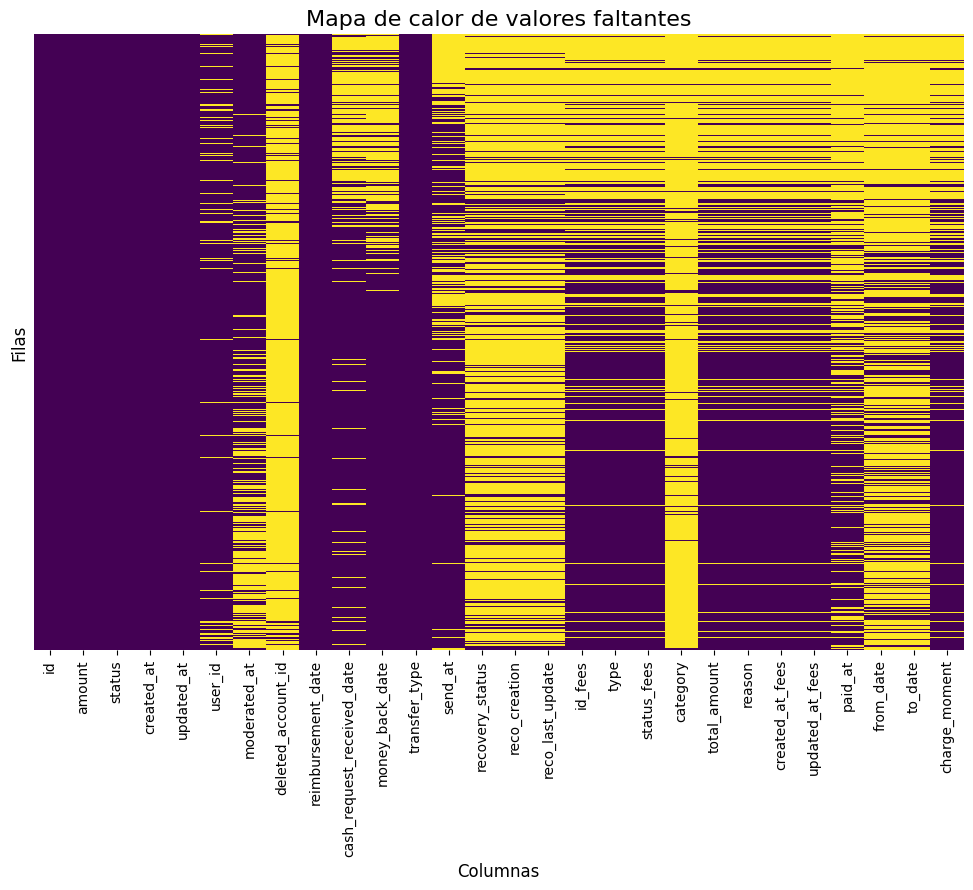

In [22]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Configurar el tamaño del gráfico
plt.figure(figsize=(12, 8))

# Crear un mapa de calor de los valores faltantes
sns.heatmap(business_payments.isnull(), cbar=False, cmap="viridis", yticklabels=False)

# Agregar título
plt.title("Mapa de calor de valores faltantes", fontsize=16)
plt.xlabel("Columnas", fontsize=12)
plt.ylabel("Filas", fontsize=12)

# Mostrar el gráfico
plt.show()


In [23]:
business_payments.describe()

,id,amount,user_id,deleted_account_id,id_fees,total_amount
count,32094.000000,32094.000000,29522.000000,2573.000000,21057.000000,21057.000000
mean,13822.217424,83.516514,31936.772576,10978.060241,10646.670228,5.000237
std,7416.239319,25.900244,26401.062842,8305.770856,6099.136169,0.034457
min,3.000000,1.000000,34.000000,91.000000,1.000000,5.000000
25%,7800.000000,50.000000,11499.000000,4071.000000,5388.000000,5.000000
50%,14115.000000,100.000000,23823.000000,7652.000000,10654.000000,5.000000
75%,19936.000000,100.000000,45419.000000,19540.000000,15926.000000,5.000000
max,27010.000000,200.000000,103719.000000,30445.000000,21193.000000,10.000000


In [26]:
business_payments.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32094 entries, 0 to 32093
Data columns (total 28 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   id                          32094 non-null  int64  
 1   amount                      32094 non-null  float64
 2   status                      32094 non-null  object 
 3   created_at                  32094 non-null  object 
 4   updated_at                  32094 non-null  object 
 5   user_id                     29522 non-null  float64
 6   moderated_at                21759 non-null  object 
 7   deleted_account_id          2573 non-null   float64
 8   reimbursement_date          32094 non-null  object 
 9   cash_request_received_date  24149 non-null  object 
 10  money_back_date             23917 non-null  object 
 11  transfer_type               32094 non-null  object 
 12  send_at                     22678 non-null  object 
 13  recovery_status             720

In [27]:
# Obteniendo una lista de las columnas del DataFrame
columnas_business_payments = business_payments.columns.tolist()

for i in columnas_business_payments:
    print("===========================")
    print(f"Columna: {i}")
    print(business_payments[i].value_counts().head(10))
    print()

Columna: id
id
12225    35
5006     28
4410     24
12452    23
11376    21
2358     19
11746    17
15319    16
11968    15
11585    15
Name: count, dtype: int64

Columna: amount
amount
100.0    21983
50.0      7047
25.0      1438
80.0       323
60.0       249
70.0       182
20.0       168
30.0       157
40.0       144
90.0       114
Name: count, dtype: int64

Columna: status
status
money_back               23270
rejected                  6568
direct_debit_rejected     1941
active                     158
direct_debit_sent           74
transaction_declined        48
canceled                    35
Name: count, dtype: int64

Columna: created_at
created_at
2020-08-12 15:38:54.26217+00     35
2020-06-24 16:13:39.243922+00    28
2020-06-20 17:40:40.07004+00     24
2020-08-14 09:16:15.702093+00    23
2020-08-07 14:11:38.2624+00      21
2020-05-30 12:33:57.977286+00    19
2020-08-10 14:45:11.12925+00     17
2020-09-09 11:02:32.494801+00    16
2020-08-11 12:27:47.272892+00    15
2020-08-09 20:34

In [28]:
import pandas as pd
import plotly.express as px

# Obtener una lista de columnas numéricas
columnas_numericas = business_payments.describe().columns.tolist()

# Crear histogramas para cada columna numérica
for columna in columnas_numericas:
    fig = px.histogram(
        business_payments,
        x=columna,
        title=f'Histograma de {columna}',
        template='plotly_white'  # Estilo más limpio
    )
    # Ajustar la altura del gráfico
    fig.update_layout(height=500)
    # Mostrar el gráfico
    fig.show()



In [29]:
import plotly.express as px

# Identificar todas las columnas del dataset
columnas_business_payments = business_payments.columns.tolist()

# Filtrar columnas numéricas
columnas_numericas_business_payments = business_payments.describe().columns.tolist()

# Iterar sobre cada columna para identificar y graficar las categóricas con ≤ 10 valores únicos
for columna in columnas_business_payments:
    if columna not in columnas_numericas_business_payments:
        # Contar la frecuencia de valores únicos en la columna
        counts = business_payments[columna].value_counts()

        # Verificar si la cantidad de valores únicos es menor o igual a 10
        if len(counts) <= 10:
            # Crear un gráfico de pastel para la distribución de la columna
            fig = px.pie(
                names=counts.index,
                values=counts.values,
                title=f'Distribución de {columna}'
            )
            # Ajustar la altura del gráfico
            fig.update_layout(height=300)
            # Mostrar el gráfico
            fig.show()


In [30]:
import plotly.express as px

# Crear diagramas de caja para cada columna numérica
for columna in columnas_numericas_business_payments:
    fig = px.box(
        business_payments,
        y=columna,
        title=f'Boxplot de {columna}',
        template='plotly_white'  # Estilo más limpio
    )
    # Ajustar la altura del gráfico
    fig.update_layout(height=500)
    # Mostrar el gráfico
    fig.show()


In [31]:
import plotly.express as px

# Crear diagramas de violín para cada columna numérica
for columna in columnas_numericas_business_payments:
    fig = px.violin(
        business_payments,
        y=columna,
        title=f'Violinplot de {columna}',
        template='plotly_white'  # Estilo más limpio
    )
    # Ajustar la altura del gráfico
    fig.update_layout(height=500)
    # Mostrar el gráfico
    fig.show()


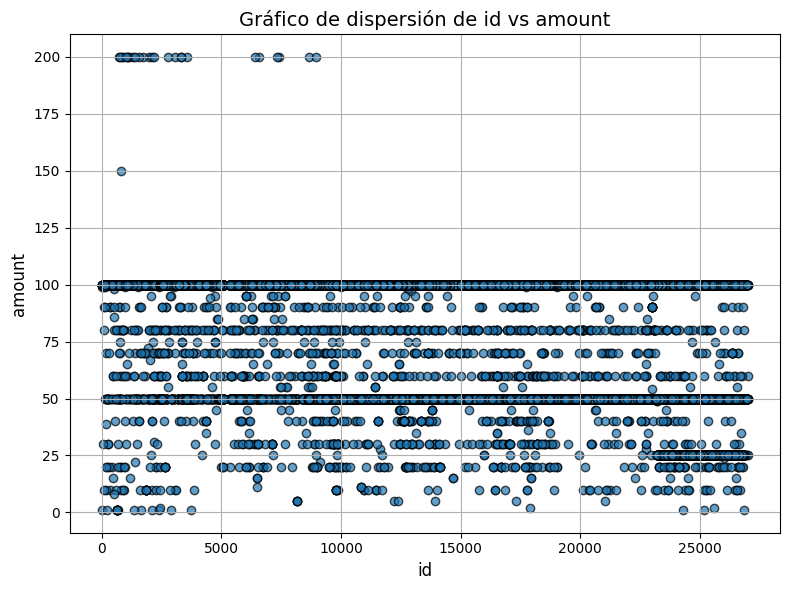

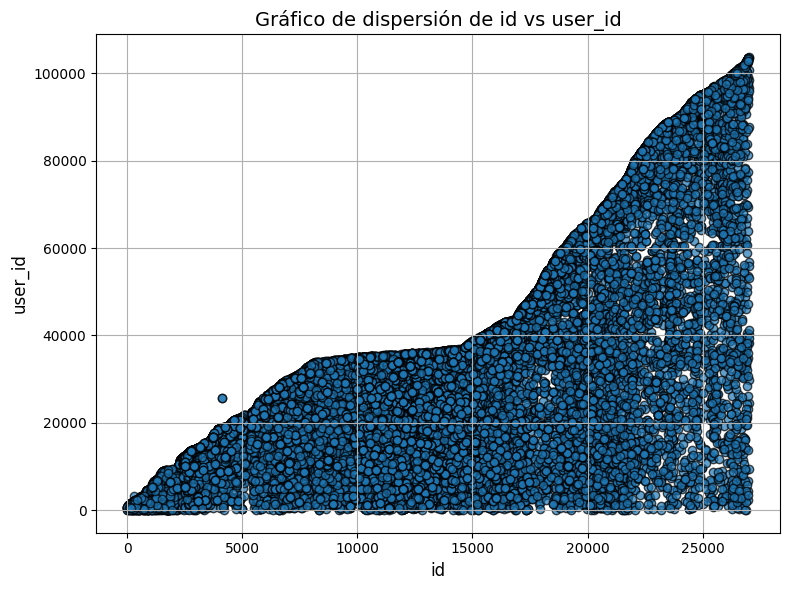

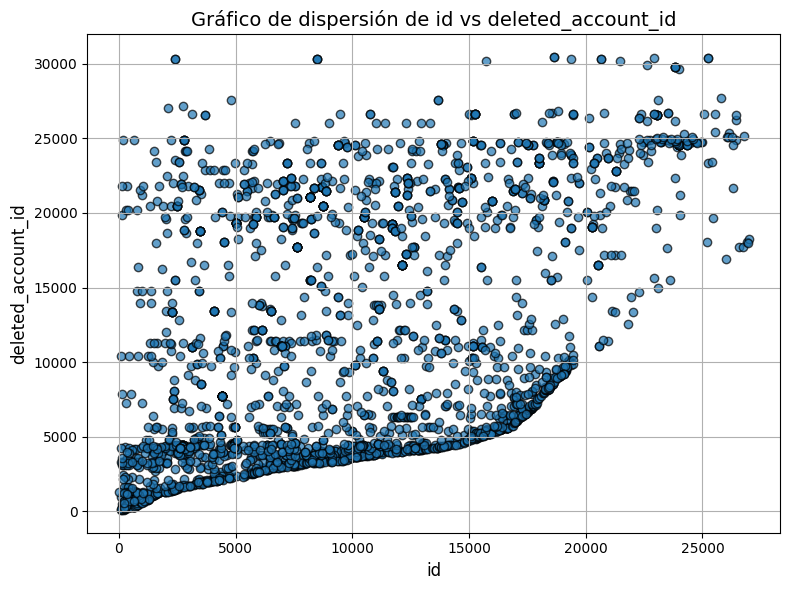

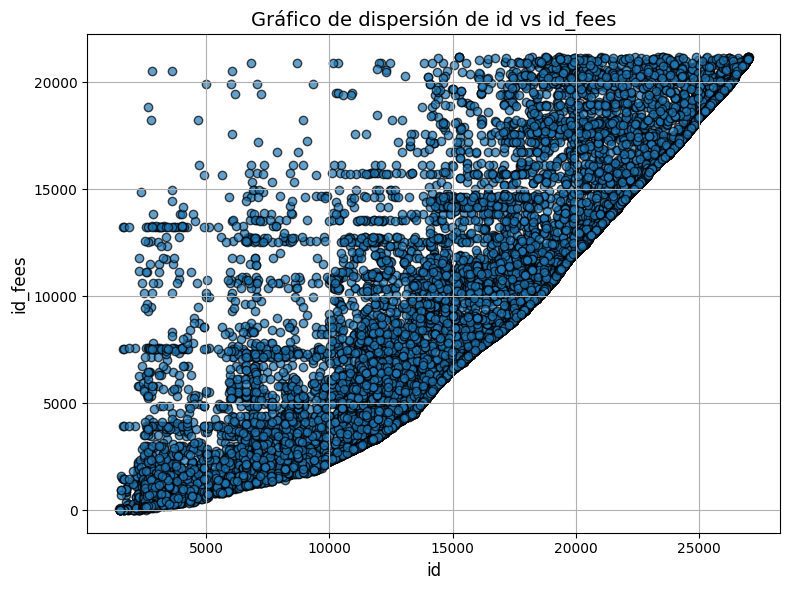

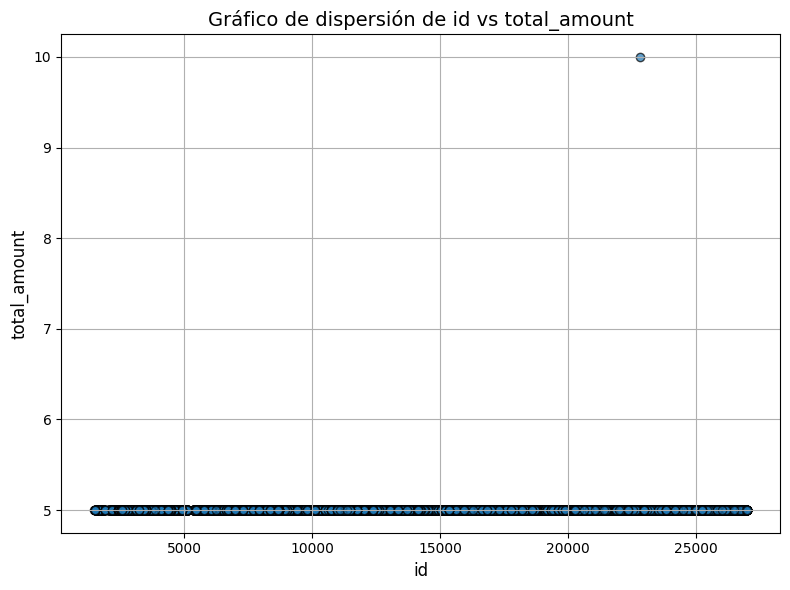

...

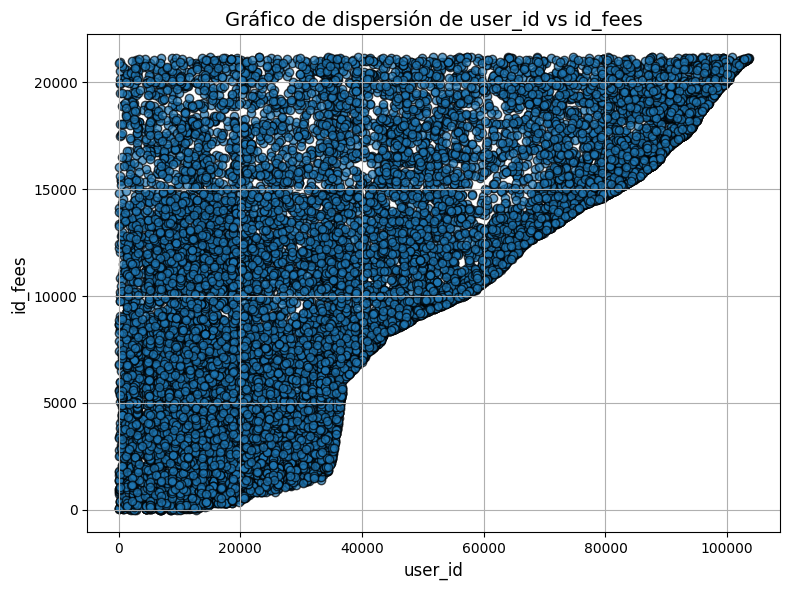

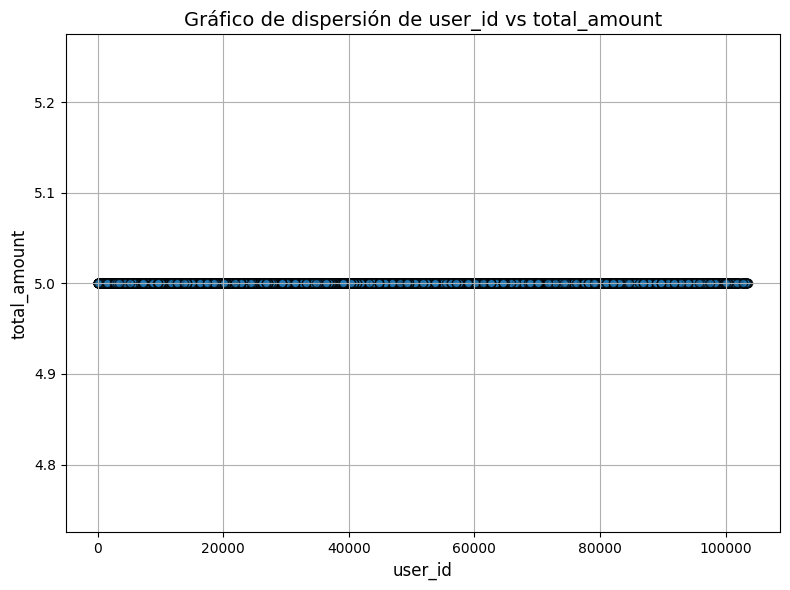

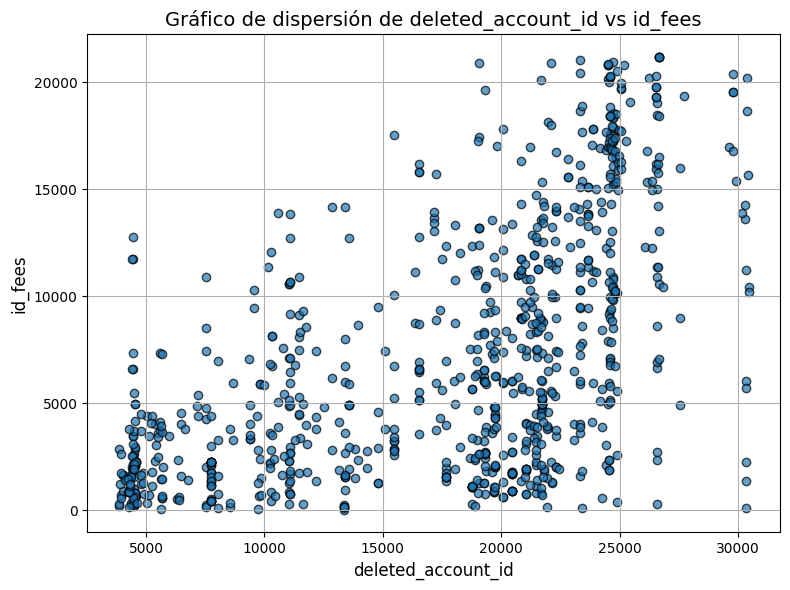

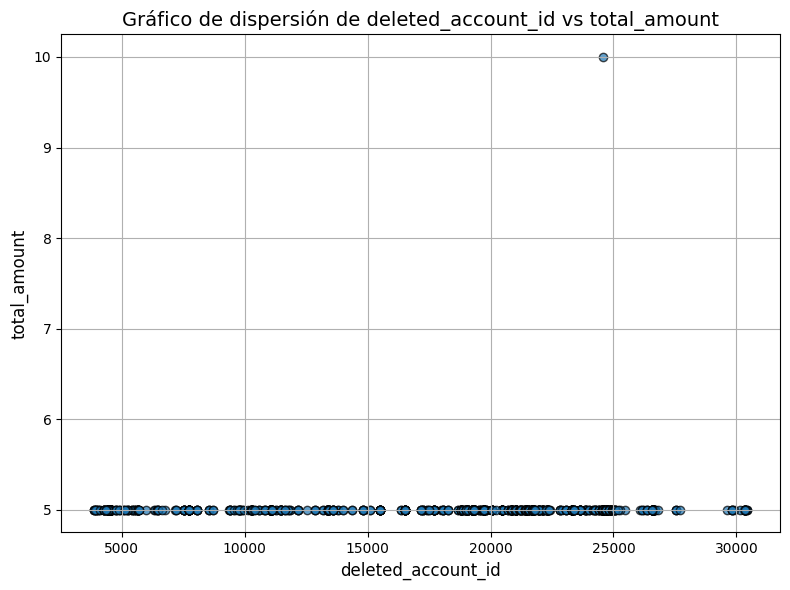

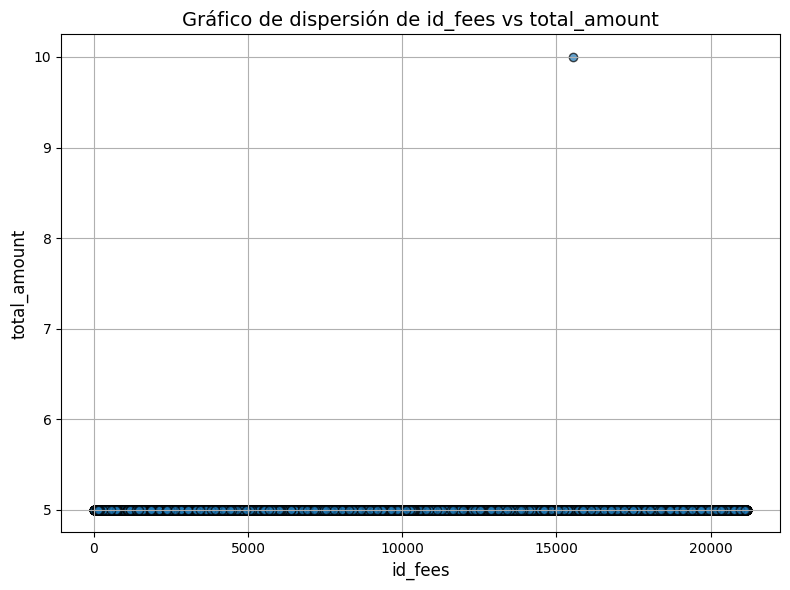

In [32]:
import itertools
import matplotlib.pyplot as plt

# Generar gráficos de dispersión para todas las combinaciones de columnas numéricas
for c1, c2 in itertools.combinations(columnas_numericas_business_payments, 2):
    plt.figure(figsize=(8, 6))
    plt.scatter(business_payments[c1], business_payments[c2], alpha=0.7, edgecolor='k')
    plt.title(f'Gráfico de dispersión de {c1} vs {c2}', fontsize=14)
    plt.xlabel(c1, fontsize=12)
    plt.ylabel(c2, fontsize=12)
    plt.grid(True)
    plt.tight_layout()
    # Mostrar el gráfico
    plt.show()


In [33]:
import itertools
import plotly.express as px

# Generar gráficos de dispersión con línea de tendencia para todas las combinaciones de columnas numéricas
for c1, c2 in itertools.combinations(columnas_numericas_business_payments, 2):
    fig = px.scatter(
        business_payments,
        x=c1,
        y=c2,
        title=f'Gráfico de dispersión de {c1} vs {c2} con línea de tendencia',
        trendline="ols",  # Agregar línea de tendencia (OLS)
        template='plotly_white'  # Estilo limpio
    )
    # Ajustar los rangos y la altura del gráfico
    fig.update_layout(
        height=500,
        xaxis=dict(title=c1, automargin=True),
        yaxis=dict(title=c2, automargin=True)
    )
    # Mostrar el gráfico
    fig.show()



/usr/local/lib/python3.11/dist-packages/statsmodels/regression/linear_model.py:1782: RuntimeWarning:

divide by zero encountered in scalar divide



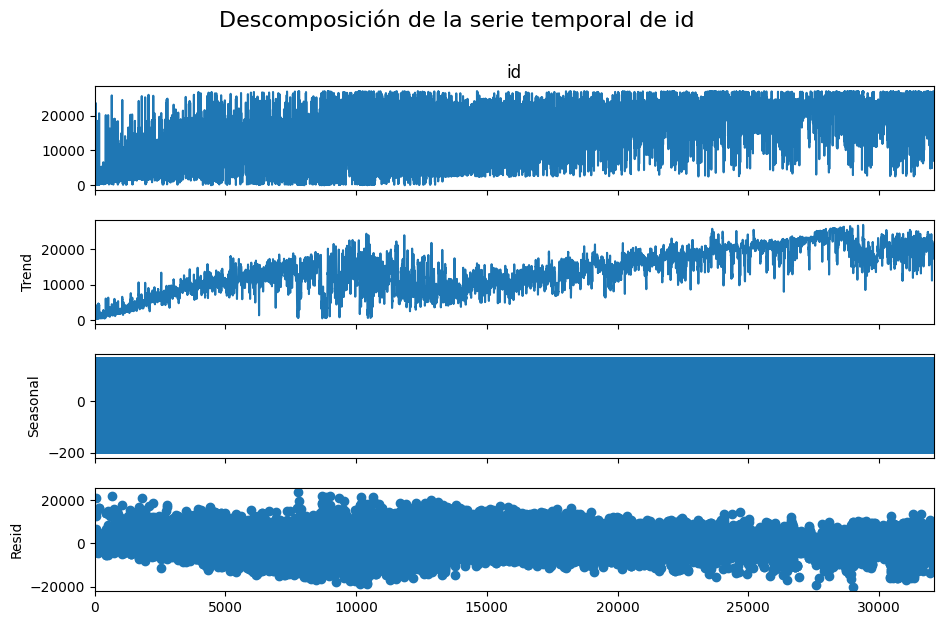

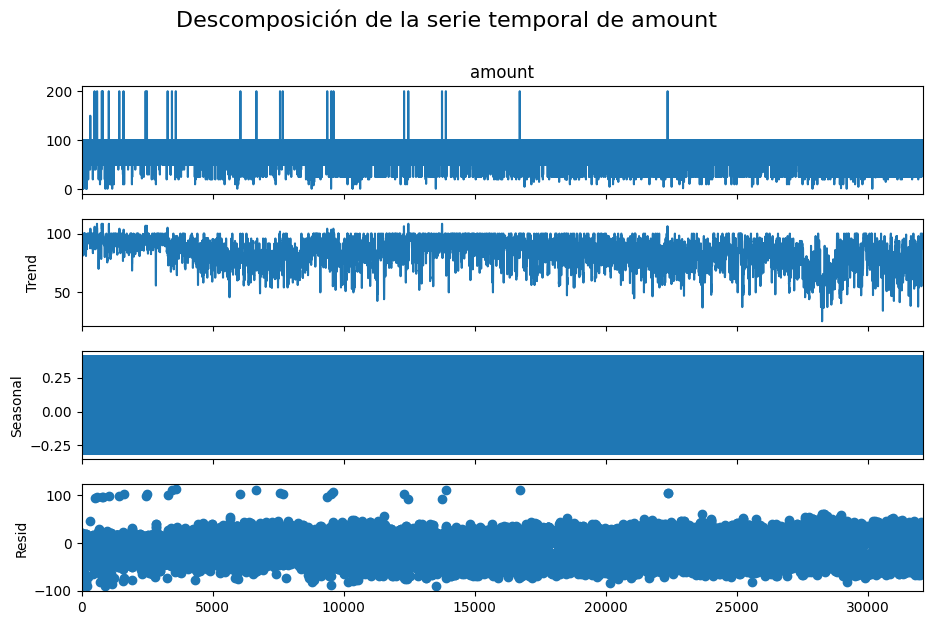

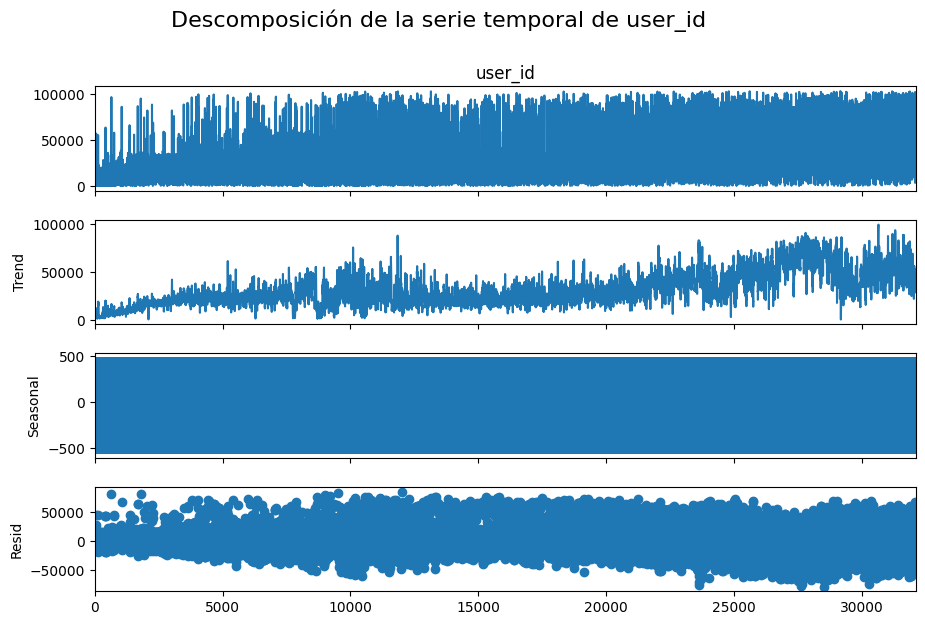

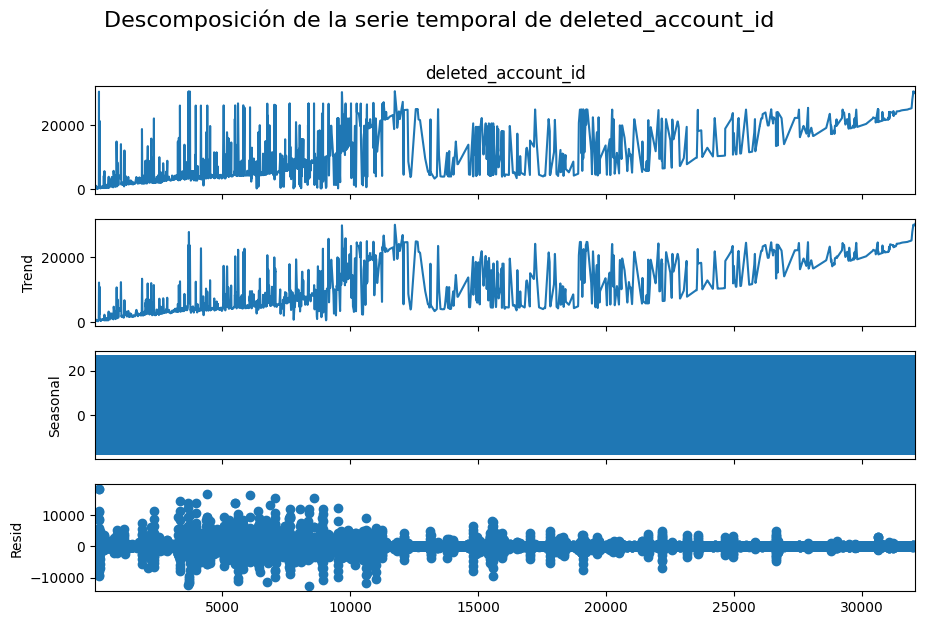

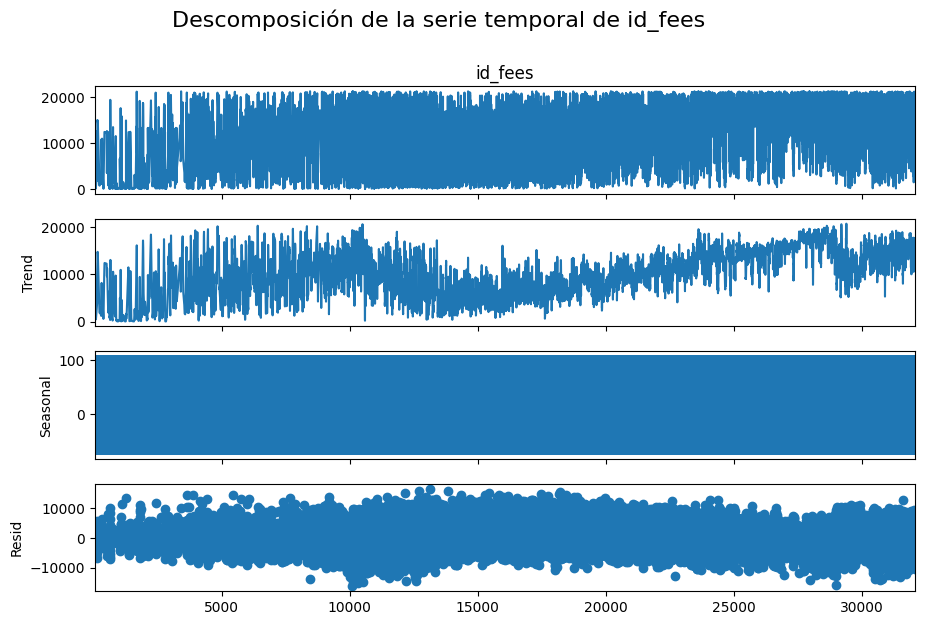

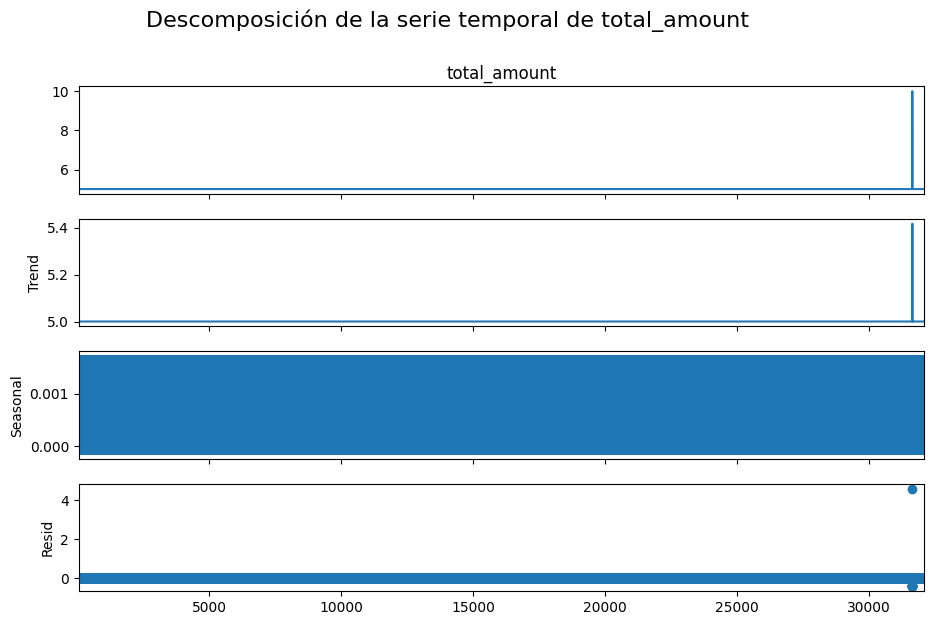

In [34]:
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.seasonal import seasonal_decompose

# Descomposición de series temporales para cada columna numérica individual
for columna in columnas_numericas_business_payments:
    # Crear una copia de la columna para trabajar
    serie_temporal = business_payments[columna].copy()

    # Verificar si hay valores faltantes y eliminarlos o interpolarlos
    if serie_temporal.isnull().any():
        serie_temporal = serie_temporal.interpolate()  # Rellenar NaN con interpolación
        serie_temporal = serie_temporal.dropna()  # Eliminar filas con valores faltantes

    # Verificar que no haya valores no finitos
    if not np.isfinite(serie_temporal).all():
        print(f'La columna {columna} contiene valores no finitos, se omite la descomposición.')
        continue

    # Intentar descomponer la serie temporal
    try:
        descomposicion = seasonal_decompose(serie_temporal, model='additive', period=12)

        # Graficar la descomposición
        fig = descomposicion.plot()

        # Ajustar el tamaño de la figura con matplotlib
        plt.gcf().set_size_inches(10, 6)

        # Ajustar el título para que no se superponga
        fig.suptitle(f'Descomposición de la serie temporal de {columna}', fontsize=16, y=1.05)

        # Mostrar el gráfico
        plt.show()
    except ValueError as e:
        print(f"No se pudo descomponer la serie temporal de {columna}: {e}")


In [35]:
business_payments.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32094 entries, 0 to 32093
Data columns (total 28 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   id                          32094 non-null  int64  
 1   amount                      32094 non-null  float64
 2   status                      32094 non-null  object 
 3   created_at                  32094 non-null  object 
 4   updated_at                  32094 non-null  object 
 5   user_id                     29522 non-null  float64
 6   moderated_at                21759 non-null  object 
 7   deleted_account_id          2573 non-null   float64
 8   reimbursement_date          32094 non-null  object 
 9   cash_request_received_date  24149 non-null  object 
 10  money_back_date             23917 non-null  object 
 11  transfer_type               32094 non-null  object 
 12  send_at                     22678 non-null  object 
 13  recovery_status             720